In [ ]:
# Imports, Instalations and Constants
!pip install transformers

import pandas as pd
import tensorflow as tf
import transformers
from transformers import DistilBertTokenizer
from transformers import TFDistilBertForSequenceClassification

pd.set_option('display.max_colwidth', None)
MODEL_NAME = 'distilbert-base-uncased-finetuned-sst-2-english'# This model is a fine-tune checkpoint of DistilBERT-base-uncased, fine-tuned on SST-2.
BATCH_SIZE = 16
N_EPOCHS = 3 # we can put more, because evaluation of the model shows big difference in loss with accuracy 1.0

     |████████████████████████████████| 4.0 MB 4.2 MB/s 
     |████████████████████████████████| 77 kB 6.4 MB/s 
     |████████████████████████████████| 596 kB 47.3 MB/s 
     |████████████████████████████████| 895 kB 41.2 MB/s 
     |████████████████████████████████| 6.6 MB 30.0 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
# dowload dataset
train = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/dataset/twitter/newdatasetwithcoviddata.csv')
test = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/dataset/twitter/shorttextpreprocessedtest.csv')


In [ ]:
train.shape

(161743, 2)

In [ ]:
Train = train.sample(10000)

In [ ]:

X_train =Train.text
X_test =test.text
y_train = Train.label
y_test = test.label 

pd.DataFrame(X_train)[:3]

,text
146653,new york hospitals study a common heartburn drug famotidine as treatment for covid
61931,ap california to allow counties to reopen schools day camps bars and gyms with limits at the end of next week
17573,facs the new coronavirus cannot be transmitted through mosquito bites \n\n pnpkakampimolabansacovid…


In [ ]:
#check the shapes and split proportion
X_train.shape, X_test.shape, y_train.shape

((10000,), (6525,), (10000,))

In [ ]:
print('The proportion in y_train\n',y_train.value_counts(normalize=True).mul(100))
print('The proportion in y_test\n',y_test.value_counts(normalize=True).mul(100))

The proportion in y_train
 1    81.86
0    18.14
Name: label, dtype: float64
The proportion in y_test
 0    84.873563
1    15.126437
Name: label, dtype: float64


In [ ]:
print(X_train)

146653                                   new york hospitals study a common heartburn drug famotidine as treatment for covid
61931         ap california to allow counties to reopen schools day camps bars and gyms with limits at the end of next week
17573                  facs the new coronavirus cannot be transmitted through mosquito bites \n\n pnpkakampimolabansacovid…
143535     commission piece created as a birthday gift lovely idea indeed getting a few pet related designs through at the…
89979       about time \nthere are approximately cruise ships remaining at sea off the east coast west coast and gulf coas…
                                                                ...                                                        
56450     going out with more people leaving their homes ask yourself these important questions about social distancing wh…
145409                           i’m in the midst of planning an covid friendly public hearing there’s a lot to think about
67065   

In [ ]:
print(X_test)

0                                                                                                                                                                                                torrance named europe s fifth ryder cup vice captain sports
1                                                                                                                                                                        i have never asked for a single earmark pork barrel project for my state of arizona
2                                                                                                                                                                                        hitting the media center to recap strong debate performance tonight
3                                                                                                                   creflo dollar needed a million gulfstream g to carry thousands of pounds of food and other supplies as well as the word of go

In [ ]:
#Max sentence length
MAX_LEN = X_train.apply(lambda s: len([x for x in s.split()])).max()
MAX_LEN

51

In [ ]:
X_test.isnull().values.any()
X_test.isnull().sum().sum()

159

In [ ]:
df=X_test.dropna()

In [ ]:
df.isnull().values.any()
df.isnull().sum().sum()

0

In [ ]:
#Encode with DistilBertTokenizer

#define a tokenizer object
tokenizer = DistilBertTokenizer.from_pretrained(MODEL_NAME)

#tokenize the text (padding to max sequence in batch)
train_encodings = tokenizer(list(X_train.values), truncation=True, padding=True)
test_encodings = tokenizer(list(df.values), truncation=True, padding=True)

#print the first paragraph and it transformation
print(f'First text: \'{X_train[:1]}\'')
print(f'Input ids: {train_encodings["input_ids"][0]}')
print(f'Attention mask: {train_encodings["attention_mask"][0]}')


Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/629 [00:00<?, ?B/s]

First text: '146653    new york hospitals study a common heartburn drug famotidine as treatment for covid
Name: text, dtype: object'
Input ids: [101, 2047, 2259, 8323, 2817, 1037, 2691, 2540, 8022, 4319, 6904, 18938, 28173, 2638, 2004, 3949, 2005, 2522, 17258, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Attention mask: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

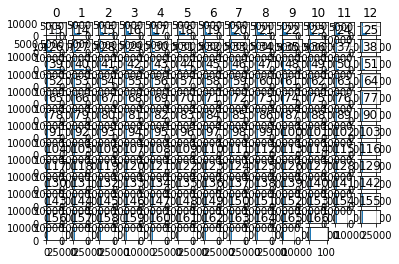

In [ ]:
#Length check
pd.DataFrame(train_encodings["input_ids"]).hist();

In [ ]:
len(train_encodings["attention_mask"][0]) #max len tokenized sentence - 167

167

In [ ]:
train_encodings

{'input_ids': [[101, 2047, 2259, 8323, 2817, 1037, 2691, 2540, 8022, 4319, 6904, 18938, 28173, 2638, 2004, 3949, 2005, 2522, 17258, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 9706, 2662, 2000, 3499, 5721, 2000, 2128, 26915, 2816, 2154, 7958, 6963, 1998, 9726, 2015, 2007, 6537, 2012, 1996, 2203, 1997, 2279, 2733, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

In [ ]:
y_test1 = y_test[:6366]

In [ ]:
#Turn the labels and encodings into a tf.Dataset object
train_dataset = tf.data.Dataset.from_tensor_slices((dict(train_encodings),
                                                    list(y_train.values)))

test_dataset = tf.data.Dataset.from_tensor_slices((dict(test_encodings),
                                                    list(y_test1.values)))

In [ ]:
train_dataset 

<TensorSliceDataset element_spec=({'input_ids': TensorSpec(shape=(167,), dtype=tf.int32, name=None), 'attention_mask': TensorSpec(shape=(167,), dtype=tf.int32, name=None)}, TensorSpec(shape=(), dtype=tf.int32, name=None))>

In [ ]:
#Fine-tuning with native TensorFlow
model = TFDistilBertForSequenceClassification.from_pretrained(MODEL_NAME)

optimizerr = tf.keras.optimizers.Adam(learning_rate=5e-5)
losss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True) # Computes the crossentropy loss between the labels and predictions. 
model.compile(optimizer=optimizerr,                                     
              loss=losss,
              metrics=['accuracy'])

model.fit(train_dataset.shuffle(len(X_train)).batch(BATCH_SIZE), 
          epochs=N_EPOCHS,
          batch_size=BATCH_SIZE)

Downloading:   0%|          | 0.00/256M [00:00<?, ?B/s]

All model checkpoint layers were used when initializing TFDistilBertForSequenceClassification.

All the layers of TFDistilBertForSequenceClassification were initialized from the model checkpoint at distilbert-base-uncased-finetuned-sst-2-english.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertForSequenceClassification for predictions without further training.


Epoch 1/3
305/625 [=============>................] - ETA: 1:02:23 - loss: 0.2987 - accuracy: 0.8859

In [ ]:
#Model Evaluation
model.evaluate(test_dataset.shuffle(len(X_test)).batch(BATCH_SIZE), return_dict=True, batch_size=BATCH_SIZE)

398/398 [==============================] - 40s 97ms/step - loss: 1.4356 - accuracy: 0.6371


{'accuracy': 0.6371347904205322, 'loss': 1.4356080293655396}

In [40]:
#Predict on the different text examples
def predict_proba(text_list, model, tokenizer):   
  encodings = tokenizer(text_list, max_length=MAX_LEN, truncation=True, padding=True)
  dataset = tf.data.Dataset.from_tensor_slices((dict(encodings))) 
  preds = model.predict(dataset.batch(1)).logits
  res = tf.nn.softmax(preds, axis=1).numpy()
    
  return res

In [41]:
string =['police uber driver held in shooting deaths of in michigan']
predict_proba(string, model, tokenizer)

array([[9.9962068e-01, 3.7926613e-04]], dtype=float32)